In [1]:
# Import necessary libraries, install them if you do not have them
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import datetime
# from datetime import datetime
import folium
from folium.plugins import HeatMap
import branca.colormap as cm
from OpenVisus import *

In [2]:
# open the idx file
# db=LoadDataset("/usr/sci/scratch_nvme/arleth/idx/firesmoke/BSC00CA12-01/BSC00CA12-01.idx")
db = LoadDataset("/Users/arleth/Mount/idx/firesmoke/BSC00CA12-01/BSC00CA12-01.idx")

SystemError: Error in swig director code what Visus throwing exception where(/Users/runner/work/OpenVisus/OpenVisus/Libs/Db/src/Dataset.cpp:311) what(empty content) where /Users/runner/work/OpenVisus/OpenVisus/build_macos/Release/VisusDbPyPYTHON_wrap.cxx : 30375 
 <no error?>

In [3]:
print(f'Total Timesteps: {len(db.getTimesteps())}')

Total Timesteps: 1035


In [4]:
t0 = db.read(field='PM25', time=0)

In [5]:
np.shape(t0)

(51, 381, 1081)

In [6]:
for i in range(51):
    print(i, np.min(t0[i]),np.max(t0[i]))

0 0.0 13.489748
1 0.0 19.035637
2 0.0 14.157013
3 0.0 1.2060657
4 0.0 2.0134106
5 0.0 2.3981175
6 0.0 10.752289
7 0.0 7.4968667
8 0.0 14.65919
9 0.0 15.835518
10 0.0 19.466791
11 0.0 23.239431
12 0.0 31.339994
13 0.0 12.736932
14 0.0 51.23104
15 0.0 290.094
16 0.0 432.43042
17 0.0 220.671
18 0.0 73.48816
19 0.0 6518.8413
20 0.0 708.243
21 0.0 802.7232
22 0.0 217.54834
23 0.0 3054.5083
24 0.0 210.99304
25 0.0 1468.1998
26 0.0 340.98224
27 0.0 63.09848
28 0.0 40.949978
29 0.0 276.26236
30 0.0 812.50305
31 0.0 119.42586
32 0.0 6.555926
33 0.0 12.460293
34 0.0 10.2742815
35 0.0 16.226616
36 0.0 12.493958
37 0.0 5.2397165
38 0.0 35.06696
39 0.0 114.7291
40 0.0 128.89606
41 0.0 78.65597
42 0.0 83.62092
43 0.0 85.79928
44 0.0 142.44426
45 0.0 86.404335
46 0.0 107.159096
47 0.0 21.446457
48 0.0 18.55323
49 0.0 0.0
50 0.0 0.0


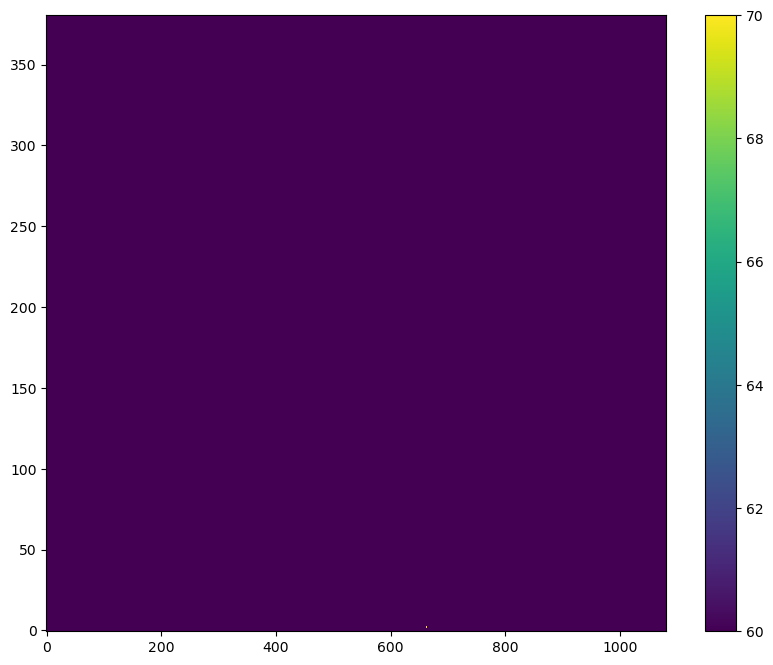

In [7]:
depth = 0  #between 0 and 89
# depth = int(depth  /db.getLogicBox()[1][2] *data3D.shape[0])
data = t0[40,:,:]
data_restricted = data
# data_restricted = np.where(data == 0, data, 14000)
fig,axes=plt.subplots(1,1,figsize=(10,8))
axp = axes.imshow(data_restricted, aspect='auto',origin='lower',cmap='viridis', vmin=60,vmax=70, norm='log')
plt.colorbar(axp,location='right')
plt.show()

## Define directories and file names

In [8]:
# ******* THIS IS WHEN RUNNING FROM ATLANTIS.SCI **************
# path containing our idx files
idx_dir = "/usr/sci/scratch_nvme/arleth/idx/firesmoke"
firesmoke_dir = "/usr/sci/cedmav/data/firesmoke"

In [9]:
# ******* THIS IS WHEN RUNNING FROM MY MACBOOK **************
# path containing our idx files
idx_dir = "/Users/arleth/Mount/idx/firesmoke"
firesmoke_dir = "/Users/arleth/Mount/firesmoke"

In [10]:
# directory name for each dataset
ids = ["BSC00CA12-01"]

# ids = ["BSC00CA12-01", "BSC06CA12-01", "BSC12CA12-01", "BSC18CA12-01", "BSC00WC04-01"]

# create paths to each dataset and to store in idx folder accordingly
idx_files = []

# make strings for paths to netcdf dirs and dir to store the idx conversions
for i in range(np.size(ids)):
    idx_files.append(f'{idx_dir}/{ids[i]}/{ids[i]}.idx')

## Get metadata for each dataset by loading on of their netCDF files

In [11]:
# Load 1 netCDF file for each dataset, this is where we get the metadata from
# this is an arbitrary choice, all the netCDF files of each dataset have the same metadata
netCDF_files = []
for id in ids:
    netCDF_files.append(xr.open_dataset(f"{firesmoke_dir}/{id}/dispersion_20240103.nc"))

In [12]:
# This dictionary will hold the metadata for each dataset
metadata = {}

# Initialize dictionary
for id in ids:
    metadata[id] = dict(lat = [], lon = [], timestamps = [])

metadata

{'BSC00CA12-01': {'lat': [], 'lon': [], 'timestamps': []}}

In [13]:
# Get timestamps from metadata (credit: Aashish Panta)
def parse_tflag(tflag):
    year = int(tflag[0] // 1000)
    day_of_year = int(tflag[0] % 1000)
    date = datetime.datetime(year, 1, 1) + datetime.timedelta(days=day_of_year - 1)

    time_in_day = int(tflag[1])
    hours = time_in_day // 10000
    minutes = (time_in_day % 10000) // 100
    seconds = time_in_day % 100

    full_datetime = datetime.datetime(year, date.month, date.day, hours, minutes, seconds)
    return full_datetime

def get_timestamps(ds):
    tflag_values = ds.TFLAG.values
    timestamps = [parse_tflag(tflag[0]) for tflag in tflag_values]
    timestamps_str = [timestamp.strftime("%Y-%m-%d %H:%M:%S") for timestamp in timestamps]
    return timestamps_str

In [14]:
# populate the dictionaries
for i, id in enumerate(ids):
    # get xarray opened dataset
    ds = netCDF_files[i]
    
    # Get metadata to compute lon and lat (credit: Aashish Panta)
    xorig = ds.XORIG
    yorig = ds.YORIG
    xcell = ds.XCELL
    ycell = ds.YCELL
    ncols = ds.NCOLS
    nrows = ds.NROWS

    # calculate lon and lat from metadata
    longitude = np.linspace(xorig, xorig + xcell * (ncols - 1), ncols)
    latitude = np.linspace(yorig, yorig + ycell * (nrows - 1), nrows)
    
    # calculate timestamps of current dataset
    timestamps = get_timestamps(ds)
    
    # store in dictionary
    metadata[id]['lon'] = longitude
    metadata[id]['lat'] = latitude
    metadata[id]['timestamps'] = timestamps

In [15]:
# Create grid to map PM25 values to lat long coords for each time step (credit: Aashish Panta)
def map_heat_time_data(data, metadata):
    # Array to populate
    heat_time_data = []

    # Get max pm25 value from entire dataset (across all time steps)
    scalar_max = np.max(data)

    # Get latitude and longitude data for creating grid to map
    curr_lat = metadata['lat']
    curr_lon = metadata['lon']
    
    # For each timestep
    for i in range(np.size(metadata['timestamps'])):
        # get the values from DataArray
        pm25_data = data[i]
        print(np.shape(pm25_data))
        # pm25_data = np.where(pm25_data > 0)
        # print(np.shape(pm25_data))

        # # get max pm25 value to normalize values by
        # if np.size(pm25_data) > 0:
        #     scalar = scalar_max
        # else:
        #     scalar = 1
            
        # create iterator of data over latitude and longitude values on current timestep i
        heat_data_i = [
            [lat, lon, float(var)]
            for lat, lon, var in zip(
                np.repeat(curr_lat, ncols),
                np.tile(curr_lon, nrows),
                pm25_data.flatten()
            )
            if var > 0
        ]
        # append to final array
        heat_time_data.append(heat_data_i)
    return heat_time_data

## Normalize PM25 values to be between 0 and 1 (for visualization weights)

In [16]:
# # note, heat_time_data is a list of different sized numpy arrays
# um = map_heat_time_data(t0, metadata[ids[0]])

In [17]:
# note, heat_time_data is a list of different sized numpy arrays
heat_time_data = map_heat_time_data(t0, metadata[ids[0]])

(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)
(381, 1081)


In [18]:
heat_time_data[0]

[[32.20000000298023, -101.49999912828207, 0.001941357972100377],
 [32.30000000447035, -101.49999912828207, 0.00033531530061736703],
 [32.6000000089407, -89.8999989554286, 13.489748001098633],
 [32.6000000089407, -89.49999894946814, 0.13856881856918335],
 [35.90000005811453, -92.19999898970127, 0.0060212863609194756],
 [35.90000005811453, -92.09999898821115, 2.931257404270582e-05],
 [54.60000033676624, -114.19999931752682, 0.0033313347958028316]]

In [19]:
# create color map
# used this: https://colorbrewer2.org/#type=diverging&scheme=BrBG&n=3
cmap = {
    0: '#ffffb2',
    0.2: '#fed976',
    0.4: '#feb24c',
    0.6: '#fd8d3c',
    0.8: '#f03b20',
    1: '#420300'
}

list(cmap.values())

['#ffffb2', '#fed976', '#feb24c', '#fd8d3c', '#f03b20', '#420300']

In [20]:
# Initialize map to Calgary's lat and lon (as in firesmoke.ca)
m = folium.Map([51, -106], zoom_start=6)
m_t = folium.Map([51, -106], zoom_start=6)

In [21]:
# # add heat data to heatmap for time step 0
HeatMap(heat_time_data[0]).add_to(m)
# add heat time data to heatmap
# hm = folium.plugins.HeatMapWithTime(heat_time_data)
hm = folium.plugins.HeatMapWithTime(heat_time_data, timestamps, radius=0.4, blur=0.6,
                                    gradient=cmap, min_opacity=0.5, max_opacity=1, scale_radius=True)
hm.add_to(m_t)


In [22]:
# add legend for color map
cmap_bar = cm.StepColormap(list(cmap.values()), vmin=1, vmax=250)
cmap_bar.caption ="PM_2.5"
cmap_bar
m_t.add_child(cmap_bar)
m_t

In [ ]:
# item_txt = """<br> &nbsp; {item} &nbsp; <i class="fa fa-map-marker fa-2x" style="color:{col}"></i>"""
# html_itms = item_txt.format( item= "mark_1" , col= "red")
# legend_html = """
#      <div style="
#      position: fixed; 
#      bottom: 50px; left: 50px; width: 200px; height: 160px; 
#      border:2px solid grey; z-index:9999; 
     
#      background-color:white;
#      opacity: .85;
     
#      font-size:14px;
#      font-weight: bold;
     
#      ">
#      &nbsp; {title} 
     
#      {itm_txt}

#       </div> """.format( title = "Legend html", itm_txt= html_itms)
# m_t.get_root().html.add_child(folium.Element( legend_html ))

m_t

Save the visualization to an HTML file. It runs stand alone.
To improve the visualization by adding a better legend, information tool bar, javascript/html/css development will be necessary (if using folium anyway).

In [ ]:
# save the map as an html file
m_t.save("index.html")